## __Final Project__

_Evironmental Statitistics and Models_

In [146]:
import numpy as np

# Reading & Transformation
import pandas as pd
import geopandas as gpd

# Curve Fit
from scipy.optimize import curve_fit

# Plotting
import pydeck as pdk
import matplotlib.pyplot as plt


# # Spatitial Stats
# import pointpats


In [147]:
import seaborn as sns
import matplotlib as mpl

mpl.rcParams.update(mpl.rcParamsDefault)

# Set Seaborn color palette
cmap = 'Set2'
sns.set_palette(cmap)

# Update Matplotlib rcParams
mpl.rcParams.update({
    'font.family': 'Consolas',  # Font family for all text
    'figure.dpi': 200,  # High resolution for figures
    
    # Axes settings
    'axes.titlesize': 12,  # Font size for the axes title
    'axes.titleweight': 'normal',  # Weight for the axes title
    'axes.labelsize': 10,  # Font size for the axes labels
    
    # Tick settings
    'xtick.direction': 'in',  # Ticks pointing inwards
    'ytick.direction': 'in',  # Ticks pointing inwards
    'xtick.minor.visible': True,  # Show minor ticks on x-axis
    'ytick.minor.visible': True,  # Show minor ticks on y-axis

    # Grid settings
    'axes.grid': True,  # Enable grid by default
    'axes.grid.which': 'both',  # Show both major and minor grids
    'grid.linestyle': ':',  # Dotted grid lines
    'grid.alpha': 0.3,  # Transparency for major grid lines
    'grid.linewidth': 0.6,  # Line width for major grid lines

})


plt.rcParams['ytick.right'] = plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

__Load Data and prepare__


In [148]:
# Read table Data
fp_table = r"data/NationalSurveyData.csv"
d = pd.read_csv(fp_table,sep=",",skipinitialspace=True,skiprows=(0,1,2,3,5,6),)

# Read Borders
shp = gpd.read_file(r"data/borders.shp")


In [149]:
# Achtung Vereinfachung
d["As"] = d['As'].str.replace(r"^<", "", regex=True).astype(float)


In [150]:
# Create a GeoDataFrame from the DataFrame and lat/lon lists
dg = gpd.GeoDataFrame(d, geometry=gpd.points_from_xy(d["LONG_DEG"], d["LAT_DEG"]))

# Set the coordinate reference system to WGS84 (EPSG:4326)
dg.set_crs(epsg=4326, inplace=True)


,SAMPLE_ID,SAMPLE_FIELD_ID,SAMPLE_DATE,LAT_DEG,LONG_DEG,YEAR_CONSTRUCTION,WELL_TYPE,WELL_DEPTH,DIVISION,DISTRICT,...,Mg,Mn,Na,P_,Si,SO4,Sr,V_,Zn,geometry
0,S98_00718,"RIP3492, BTS118",08/03/1998,23.0194,90.8786,1971.0,Shallow HP TW,12.2,Chittagong,Lakshmipur,...,29.9,0.447,7.9,1.2,13.9,< 0.2,0.246,< 0.006,0.031,POINT (90.87860 23.01940)
1,S98_00724,"RIP3493, BTS124",10/03/1998,22.9650,90.9597,1995.0,Private HP TW,12.2,Chittagong,Lakshmipur,...,15.7,0.231,205.0,0.6,13.8,1.5,0.108,< 0.006,0.021,POINT (90.95970 22.96500)
2,S98_00727,"RIP3498, BTS127",10/03/1998,22.9253,90.9744,1997.0,Private HP TW,262.1,Chittagong,Lakshmipur,...,75.8,0.294,201.0,0.3,27.2,4.9,0.873,< 0.006,0.067,POINT (90.97440 22.92530)
3,S98_00733,"RIP3494, BTS133",11/03/1998,22.8653,90.9372,1993.0,Private HP TW,7.9,Chittagong,Lakshmipur,...,124,1.17,1090.0,0.5,10.3,265,0.797,0.009,0.054,POINT (90.93720 22.86530)
4,S98_00734,"RIP3499, BTS134",11/03/1998,22.8525,90.9058,1990.0,Village HP TW,182.9,Chittagong,Lakshmipur,...,16.9,0.051,43.8,0.2,21.4,< 0.2,0.216,< 0.006,< 0.008,POINT (90.90580 22.85250)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3528,S99_07379,RIP7379,05/07/1999,24.7733,88.8000,1998.0,TARA,33.5,Rajshahi,Naogaon,...,12.6,1.01,30.4,< 0.1,26.5,2.4,0.153,< 0.002,0.038,POINT (88.80000 24.77330)
3529,S99_07380,RIP7380,05/07/1999,24.7183,88.7750,1992.0,TARA,34.4,Rajshahi,Naogaon,...,18.6,0.346,237.0,0.2,24.7,< 0.2,0.263,< 0.002,0.016,POINT (88.77500 24.71830)
3530,S99_07381,RIP7381,05/07/1999,25.1039,88.5713,1987.0,HTW,59.4,Rajshahi,Naogaon,...,11.2,0.125,17.4,< 0.1,15.7,0.6,0.17,< 0.002,0.032,POINT (88.57130 25.10390)
3531,S99_07382,RIP7382,05/07/1999,25.0296,88.6054,1994.0,TARA,42.7,Rajshahi,Naogaon,...,9.28,0.234,28.0,< 0.1,29.6,0.5,0.163,< 0.002,0.017,POINT (88.60540 25.02960)


In [151]:
dg.columns

Index(['SAMPLE_ID', 'SAMPLE_FIELD_ID', 'SAMPLE_DATE', 'LAT_DEG', 'LONG_DEG',
       'YEAR_CONSTRUCTION', 'WELL_TYPE', 'WELL_DEPTH', 'DIVISION', 'DISTRICT',
       'THANA', 'UNION', 'MOUZA', 'GEOCODE', 'As', 'Al', 'B_', 'Ba', 'Ca',
       'Co', 'Cr', 'Cu', 'Fe', 'K_', 'Li', 'Mg', 'Mn', 'Na', 'P_', 'Si', 'SO4',
       'Sr', 'V_', 'Zn', 'geometry'],
      dtype='object')

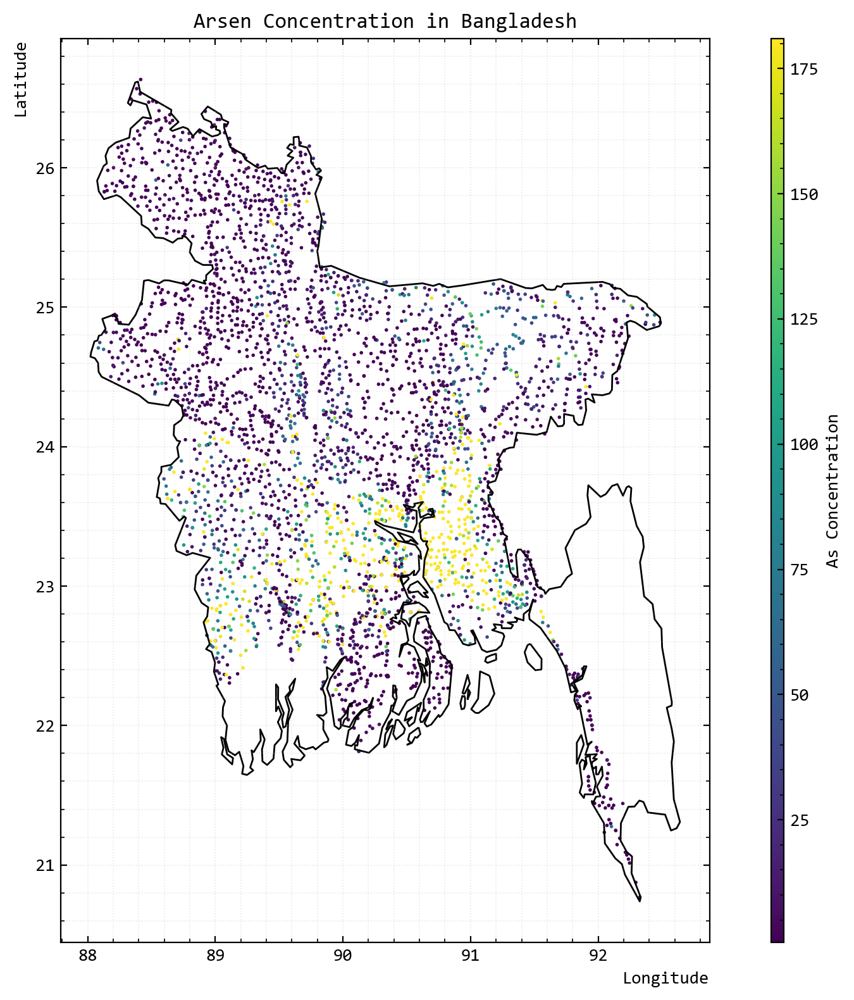

In [152]:
fig, ax = plt.subplots(figsize=(10, 8))
gdf_plot = dg.plot(column='As', cmap='viridis', vmax=np.nanpercentile(dg["As"], 90), vmin=np.nanpercentile(dg["As"], 5), markersize=1, ax=ax)
plt.title('Arsen Concentration in Bangladesh')
shp.plot(ax=gdf_plot, edgecolor='black', facecolor='none')
fig.colorbar(gdf_plot.collections[0], ax=gdf_plot,orientation="vertical",shrink=1,aspect=70,label="As Concentration")
ax.set_xlabel('Longitude',loc="right")
ax.set_ylabel('Latitude',loc="top")
plt.tight_layout()
# ax.set_xticklabels([f'{tick}°' for tick in ax.get_xticks()])
# ax.set_yticklabels([f'{tick}°' for tick in ax.get_yticks()])
plt.show()

In [153]:
gj = shp.to_json()

# Create a Pydeck GeoJsonLayer
poly= pdk.Layer(
        "GeoJsonLayer",
        data=shp,
        get_fill_color=[100,100,100,0],
        get_line_color=[120,120,120,255],  # Border color
        line_width_min_pixels=1.5
    )

# Define a layer to display the points
layer = pdk.Layer(
    'ScatterplotLayer',
    data=dg,
    get_position='[LONG_DEG, LAT_DEG]',
    get_fill_color='[0 + As * 2, 30 + As * 10, 180-As*2, 255]',
    get_radius=1400,
    pickable=True
)

# Set the viewport location
view_state = pdk.ViewState(
    latitude=dg['LAT_DEG'].mean(),
    longitude=dg['LONG_DEG'].mean(),
    zoom=7,
    pitch=0
)

# Render the deck.gl map with a light theme
r = pdk.Deck(
    layers=[poly,layer],
    initial_view_state=view_state,
    map_provider=None,
    height=500,
    tooltip={"text": "{As}"},
    map_style="light_no_labels" 
)
r.to_html('ScatterplotLayer.html',iframe_height=800)

### __Variogramm__

In [154]:
# Ellipsoidal Coordinates to Metric CRS
main_crs = "EPSG:9678" # https://epsg.io/9678
dg = dg.to_crs(main_crs)
shp = shp.to_crs(main_crs)


In [155]:
# east = dg.geometry.x
# north = dg.geometry.y

# Position Vector of Observations
x_o = dg.get_coordinates().values # [East , North] # m

n_points = len(x_o[:,0])

print(f"n points: {n_points} observations")

n points: 3533 observations


In [156]:
## Point to Point Distances, for all points

dists = np.linalg.norm(x_o[:,np.newaxis] - x_o[np.newaxis,:],axis=-1)

# Distanzan sind in beide Richtungen deswegen hälftze löschen
dists_half = np.triu(dists) # Diagonale auch null das nicht abstand mit sich selber berücksichtigt wird

In [157]:
## Histogram for Distances
n_bins = 60

select_max_dist = 90 # %


# Histogramm
hist, bin_edges = np.histogram(dists,n_bins,range=(0,np.percentile(dists,select_max_dist)))

# Mean Lag h in each class
bin_centers = (bin_edges[1:]+bin_edges[:-1])/2


## Z Values
z = d["As"].values
z_diff = z[:,np.newaxis] - z[np.newaxis,:]
z_diff_half = np.triu(z_diff) # Clean that not double distance for every pair


print("-------------")
print("Max used distance:",np.percentile(dists,80)/1000,"km ("+str(select_max_dist)+" %)")
print("-------------")


-------------
Max used distance: 277.09628404895585 km (90 %)
-------------


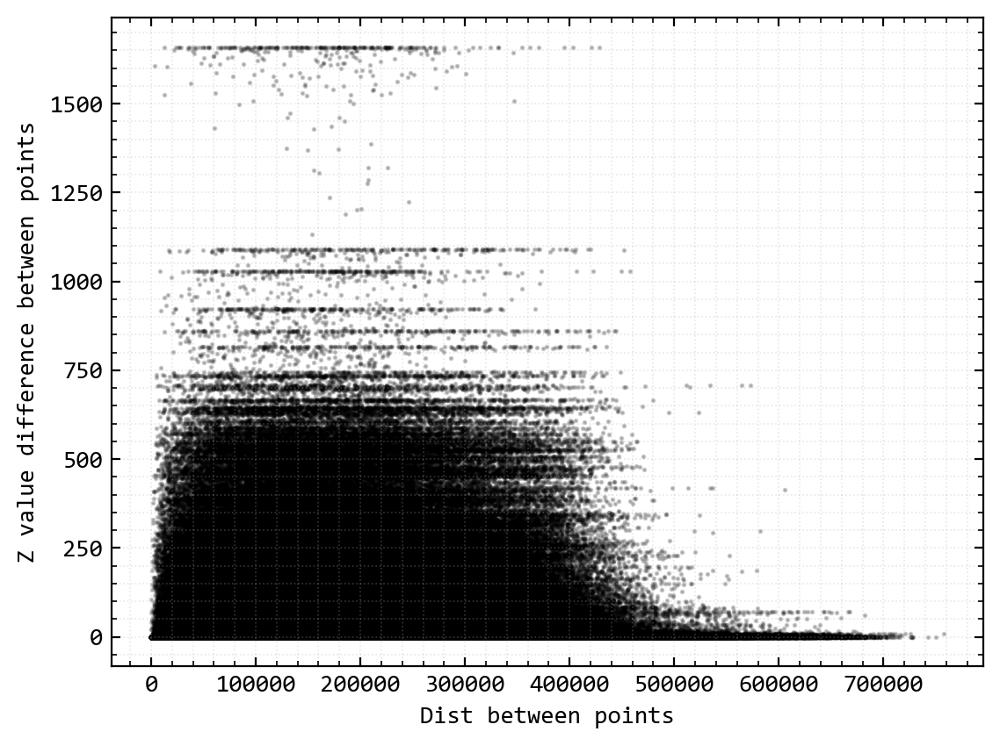

In [158]:
plt.scatter(dists.flatten()[::10],np.abs(z_diff_half.flatten()[::10]),s=1,c="k",alpha=0.2)
plt.xlabel("Dist between points")
plt.ylabel("Z value difference between points")

plt.show()

The Semivarinace is defined as followed:

$$
γ(h)=\frac{1}{2N(h)} \sum_{i=1}^{N}(Z(x_i+h)−Z(x_i))^2
$$

- where $h$ is the distance between points in the lag class
- $N(h)$ is the number of points with the distance h (Number of points per lag class).
- $x_i$ is the position of the i-th point and $Z$ is the attribute value at the position $x_i$

_(Benndorf, 2023)_

Benndorf, Jörg. Angewandte Geodatenanalyse und -Modellierung. 2023. Springer Vieweg Wiesbaden. 978-3-658-39981-8. https://doi.org/10.1007/978-3-658-39981-8

In [159]:
## Semivariance
semi_var = np.zeros(len(hist)) * np.nan

# Iterate over all lag classes
for i in range(len(hist)):
    
    # Selecting all Z values in the actual Lag Class (h or dist-class)
    diff = z_diff[(dists >= bin_edges[i]) & (dists < bin_edges[i+1])]

    # plt.figure()
    # im = plt.imshow((dists >= bin_edges[i]) & (dists < bin_edges[i+1]),origin="lower",cmap="Greys_r")
    # plt.colorbar(im)
    # plt.show()

    # Count Distances in class
    n = np.sum((dists >= bin_edges[i]) & (dists < bin_edges[i+1]) ) # number of distances in class i
    
    # print(n)
    # print(np.sum( diff**2 ))
    # print(1 / (n*2) * np.sum( diff**2 ))
    # print("---")

    # Semivariance for Class i
    semi_var[i] = 1 / (n*2) * np.sum( diff**2 )

### __Theoretical Variogramm Model Fitting__

In [160]:
# https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html


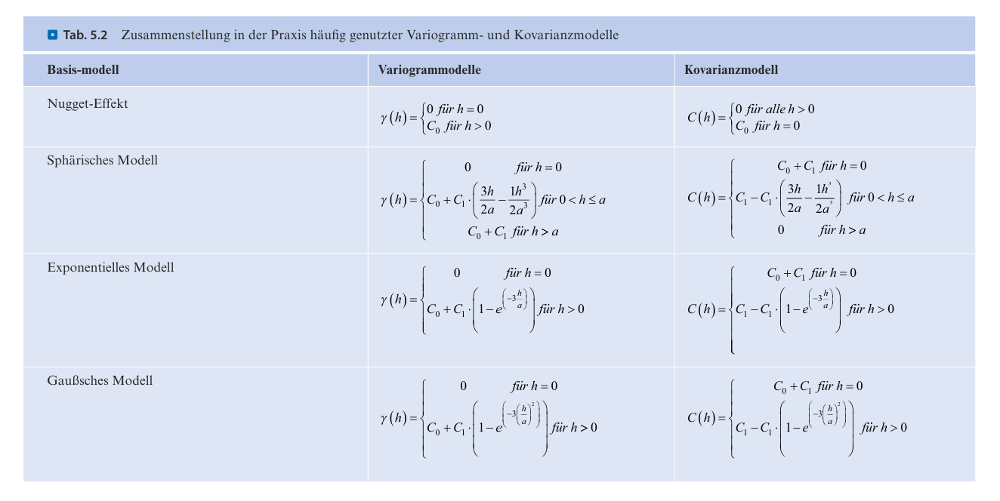

The formula for the spherical variogram model is given by:

$$
\gamma(h) = 
\begin{cases}
0 & \text{if } h = 0 \\
C_0 + C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 \leq h \leq a \\
C_0 + C & \text{if } h > a 
\end{cases}
$$

where:
- $h$ is the lag distance,
- $C_0$ is the nugget,
- $C$ is the sill minus the nugget,
- $a$ is the range.

Modified formula to include $C_0$ fo $h=0$ (Wieder rausgenommen wegen theorie zu Covarinace)

In [161]:
def spherical(h, c0, c, a):
    semivar = np.zeros_like(h)
    mask0 = h == 0
    mask1 = (h >0 ) & (h <= a)
    mask2 = h > a
    semivar[mask1] = 0
    semivar[mask1] = c0 + c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    semivar[mask2] = c0 + c
    return semivar


def spherical_cov(h, c0, c, a):
    covariance = np.zeros_like(h)
    mask1 = (h > 0 ) & (h <= a)
    mask2 = h == 0
    covariance[mask1] = c - c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    covariance[mask2] = c0 + c # Nugget effect
    # covariance for h > a is already Zero due to covariance initalization as zeros_like
    return covariance


x = bin_centers[1:] # Drop first element to remove peak/disturbance
y = semi_var[1:]
# TODO automate the p0 value selction from expireminetal variogram
# TODO hinzufügen von bounds wie in https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html
p0 = [0, np.mean(x_o[:,1]), np.mean(x_o[:,0])]

cof_u, cov = curve_fit(spherical, x, y,p0 = p0 )

print(f"Nugget (C_0): {cof_u[0]:.2f}")
print(f"Sill (C_1): {cof_u[1]:.2f}")
print(f"Range (a): {cof_u[2]:.2f}")
print(f"max Var: {cof_u[0]+cof_u[1]:.2f}")

Nugget (C_0): 8894.32
Sill (C_1): 5405.94
Range (a): 64456.00
max Var: 14300.26


In [162]:
np.var(z)

14017.793352598273

__Covariance and Interpolations weights__

The Covariance is derived from the Semmivariance:

$$
Cov(h) = 
\begin{cases} 
C_0 + C & \text{if } h = 0 \\
C - C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 < h \leq a \\
0 & \text{if } h > a 
\end{cases}
$$

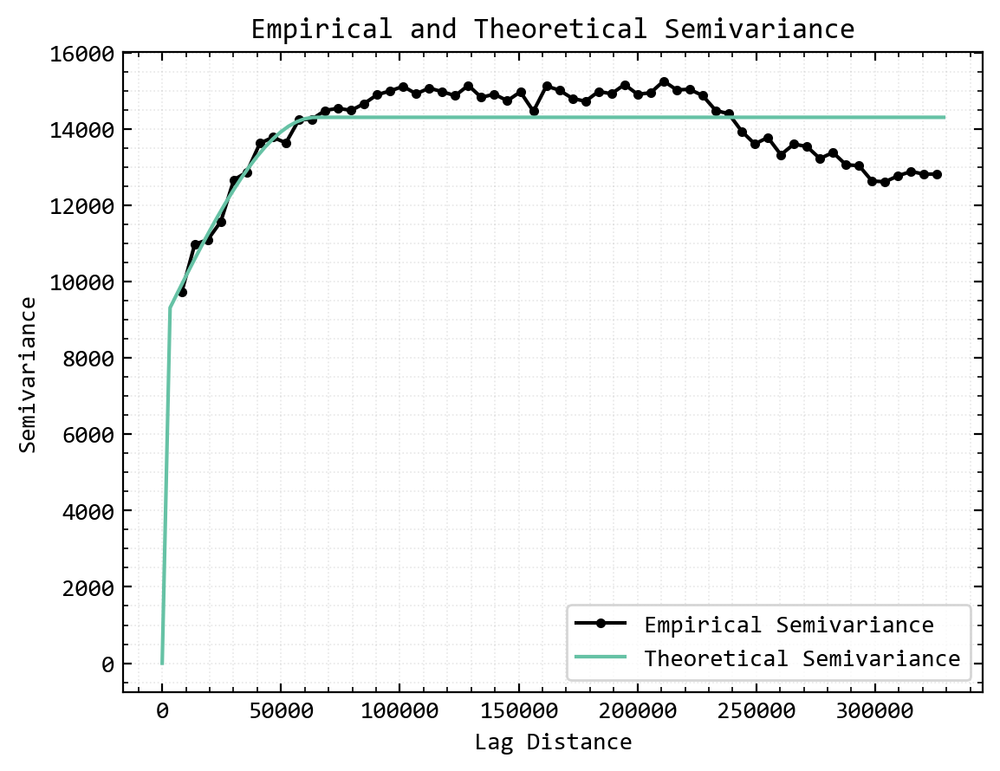

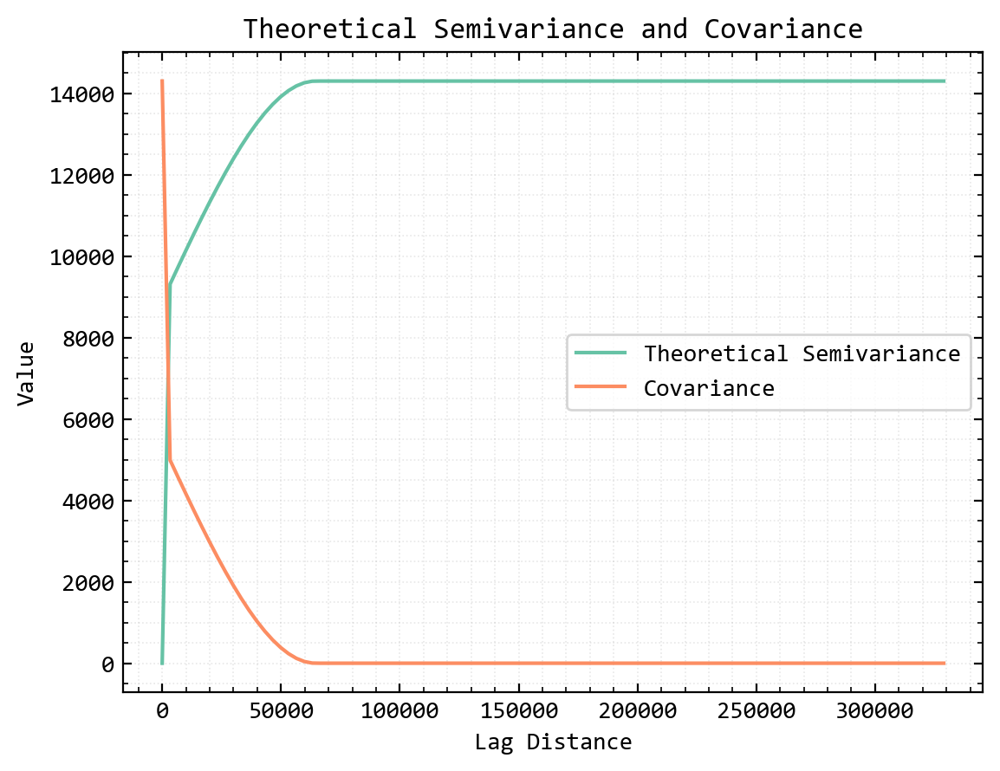

In [163]:
# Plot Spherical Model
h_theo = np.linspace(0,bin_edges.max(),100)
semivar_theo = spherical(h_theo,cof_u[0],cof_u[1],cof_u[2])

cov = spherical_cov(h_theo,cof_u[0],cof_u[1],cof_u[2])

plt.plot(bin_centers[1:], semi_var[1:], marker='o', ms=3, c="k", label='Empirical Semivariance')
plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.xlabel('Lag Distance')
plt.ylabel('Semivariance')
plt.title('Empirical and Theoretical Semivariance')
plt.legend()
plt.show()


plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.plot(h_theo, cov, label='Covariance')
plt.xlabel('Lag Distance')
plt.ylabel('Value')
plt.title('Theoretical Semivariance and Covariance')
plt.legend()
plt.show()

### __Kriging__

_"Kriging is basically a generalization of minimum mean square error estimation taking into account spatial correlation"_ (B. S. Daya Sagar,Handbook  
of Mathematical 
Geosciences,2018)

__Literature:__
- ArcGis Documentation: https://pro.arcgis.com/en/pro-app/latest/tool-reference/3d-analyst/how-kriging-works.htm
- Gstat: https://scikit-gstat.readthedocs.io/en/latest/userguide/kriging.html
- Handbook of Mathematical Geosciences: https://doi.org/10.1007/978-3-319-78999-6
- Angewandte Geodatenanalyse und -Modellierung: https://doi.org/10.1007/978-3-658-39981-8 





#### __1. Simple Kriging__

The Weigths for the Kriging are Calulated via the Covariance for each interpolation point:

$$
\lambda = \mathbf{C^{-1} \cdot c_0}
$$

the matrizes looks like that:



$$
\lambda =
\begin{bmatrix}
    \lambda_1 \\
    \lambda_2 \\
    \vdots \\
    \lambda_2
\end{bmatrix}, \quad
\mathbf{C} =
\begin{bmatrix}
    \text{Cov}[x_1, x_1] & \text{Cov}[x_1, x_2] & \cdots & \text{Cov}[x_1, x_n] \\
    \text{Cov}[x_2, x_1] & \text{Cov}[x_2, x_2] & \cdots & \text{Cov}[x_2, x_n] \\
    \vdots & \vdots & \ddots & \vdots \\
    \text{Cov}[x_n, x_1] & \text{Cov}[x_n, x_2] & \cdots & \text{Cov}[x_n, x_n]
\end{bmatrix}, \quad
\mathbf{c}_0 =
\begin{bmatrix}
    \text{Cov}(x_1, x_0) \\
    \text{Cov}(x_2, x_0) \\
    \vdots \\
    \text{Cov}(x_n, x_0)
\end{bmatrix}
$$


__Simple Kriging__

$$
Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + \lambda_m \cdot m
$$

$$with$$

$$
\lambda_m = 1 - \sum_{i=0}^{n} \lambda_i.
$$


If we insert $\lambda_m$ and rewrite:

$$

Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + 1\cdot m - \sum_{i=0}^{n} \lambda_i \cdot m
$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot (z(x_i) -m) + m$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \lambda^{T} \cdot (\mathbf{Z} -m) + m$$


In [164]:
# Map range Bangladesh
n_range = (x_o[:,1].min(),x_o[:,1].max())
e_range = (x_o[:,0].min(),x_o[:,0].max())

# Interpolation Coords
res = 10_000
x_n, x_e = np.mgrid[n_range[0]:n_range[1]:res,e_range[0]:e_range[1]:res]

In [165]:
x_p = np.asarray([x_e.flatten(),x_n.flatten()]) # points of interpolation

x_p = x_p.T # Transverse to make it vertical
# x_p = np.rot90(x_p)

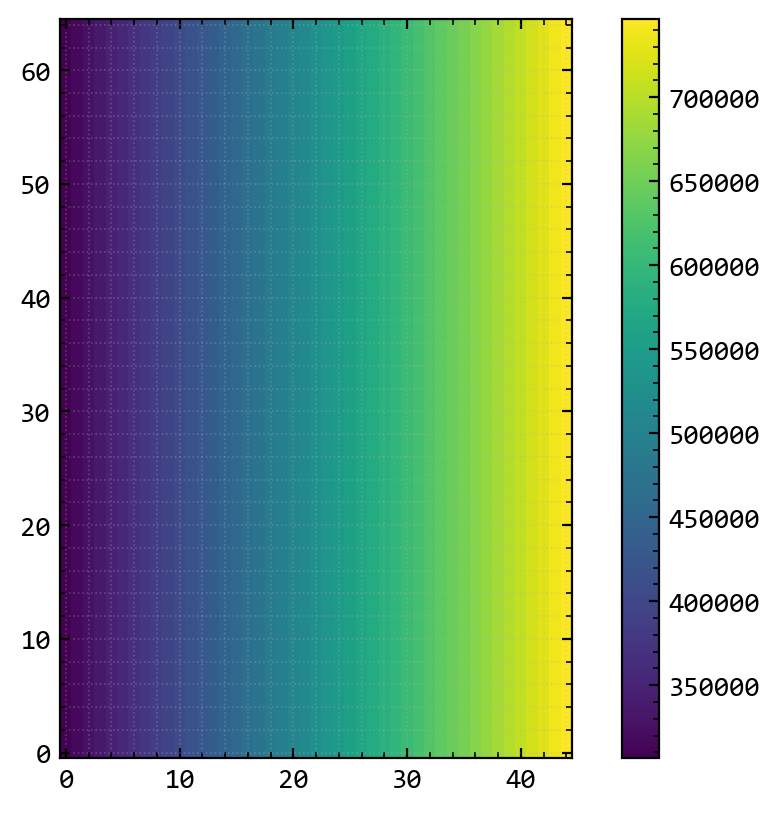

In [166]:
plt.imshow(x_p[:,0].reshape(x_n.shape),origin="lower")
plt.colorbar()
plt.show()

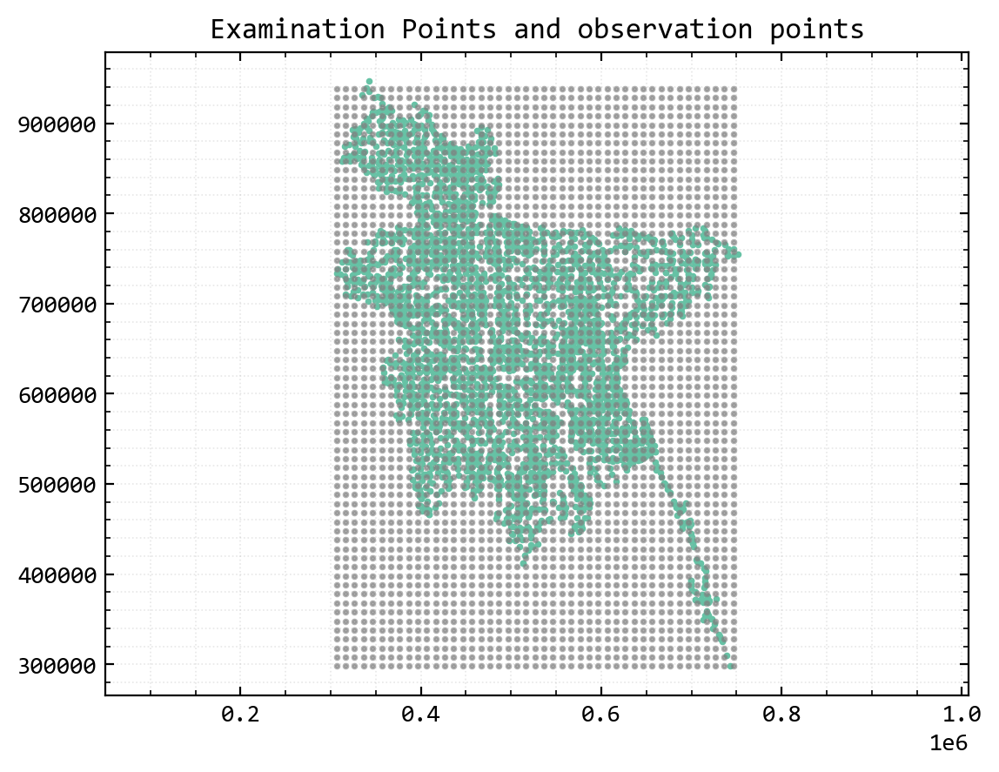

In [167]:
plt.title("Examination Points and observation points")
plt.scatter(x_o[:,0],x_o[:,1],s=3)
plt.scatter(x_p[:,0],x_p[:,1],s=3,c="grey",alpha=0.6)
plt.axis("equal")
plt.show()

In [168]:
# np.linalg.matrix_rank(C)
# 3419
# shape = (3533, 3533)


In [169]:
# Covariance for all Observation Points
C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2]) # TODO include local search area to cut computing costs

# Calculating Inverse
C_iv = np.linalg.inv(C) ## TODO Problem mit der Inversen scheinbar?

# Mean to detrend Z
m = z.mean()

In [170]:
import sys

# Test C matrix for invertability:
#print("Condition number of C:", np.linalg.cond(C))
print("Reciprocal of machine epsilon:", 1/sys.float_info.epsilon)


Reciprocal of machine epsilon: 4503599627370496.0


In [171]:
##  Most Likely very wrong ##

# Z_sk = np.empty(x_p.shape[0])
# for i in range(x_p.shape[0]):

#     dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
#     c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    
#     lam = C_iv @ c_0[:, None] # Weights based on cavariance and dinstance (Cov in c_0)
#     lam_m = 1 - np.sum(lam)
#     print(i,lam.max(),lam_m)

#     Z_sk[i] = np.sum( lam * z + lam_m * m ) # interpolated value

In [185]:
Z_sk = np.empty(x_p.shape[0])
for i in range(x_p.shape[0]):

    dists_p = np.linalg.norm(x_o[:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    
    lam = C_iv @ c_0[:, None] # Weights based on cavariance and dinstance (Cov in c_0)

    #lam = np.linalg.solve(C,c_0)

    #print(i,np.sum(lam))

    Z_sk[i] = (lam.T @ (z-m) ) + m # interpolated value

C:\Users\Florian\AppData\Local\Temp\ipykernel_2992\2690079299.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Z_sk[i] = (lam.T @ (z-m) ) + m # interpolated value


In [173]:
Z_sk.shape

(2925,)

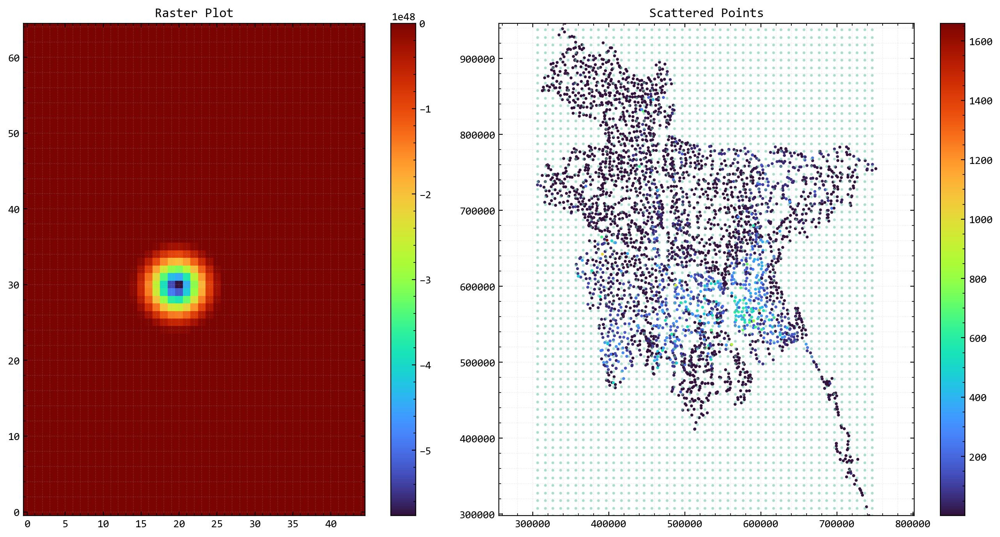

In [174]:
Z_sk = Z_sk.reshape(x_e.shape)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 90))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()

3rd Attempt

In [208]:
# Find all Obs points inside the max range
max_range = cof_u[2] * 0.5

print(f"Range (a): {cof_u[2]:.2f} m / {cof_u[2]/1000:.2f} km")
print(f"Search range (radius) Kriging: {max_range:.2f} m / {max_range/1000:.2f} km")


Range (a): 64456.00 m / 64.46 km
Search range (radius) Kriging: 32228.00 m / 32.23 km


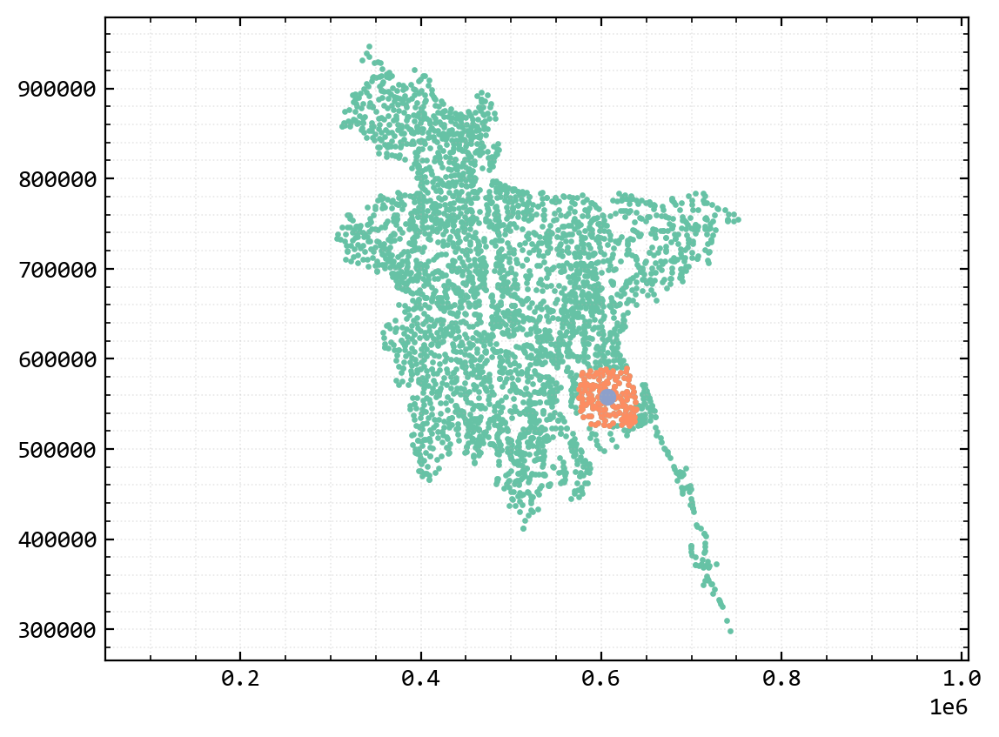

In [209]:
# Example for one itnerpolation point in the grid
i = 1200
neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

plt.scatter(x_o[:,0],x_o[:,1],s=2)
plt.scatter(x_o[neighborhood,0],x_o[neighborhood,1],s=2)

plt.scatter(x_p[i,0],x_p[i,1])
plt.axis("equal")
plt.show()


# Select Neigborhod of examination/interpolation Point according to range Parameter
neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

# Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    



In [210]:
np.sort(dists.flatten())[:180]

array([   0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.     

In [211]:
print(f"Min of C: {C.min()}")
print(f"Max of C: {C.max()}")
print(f"Mean of C: {C.mean()}")
print(f"Std of C: {C.std()}")


Min of C: 0.0
Max of C: 14300.26024579172
Mean of C: 1963.000234049194
Std of C: 1736.666764443451


In [212]:
np.sort(C.flatten())[:600]


array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
      

__Improve the Conditioning of C:__

The bad conditioning of the matrix ( C ) in your code can be caused by several factors, including:

Collinearity: If the points in the neighborhood are very close to each other or lie on a straight line, the covariance matrix ( C ) can become nearly singular.


Small Variance: If the variance of the data points is very small, the covariance values can be very close to each other, leading to a poorly conditioned matrix.


Range Parameter: If the max_range parameter is too large, it might include points that are not relevant, leading to a covariance matrix that is difficult to invert.
Strategies to Fix It
Regularization: Add a small value to the diagonal of the covariance matrix to improve its conditioning. This technique is known as Tikhonov regularization or ridge regression.

Neighborhood Selection: Ensure that the neighborhood selection is appropriate and does not include too many points or points that are too far away.

Check for Collinearity: Ensure that the points in the neighborhood are not collinear. You can use techniques like Principal Component Analysis (PCA) to check for collinearity.

Scaling: Normalize or standardize the data points before computing the covariance matrix to ensure that the values are within a reasonable range.

In [ ]:

Z_sk = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    
    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    

    # Check if the matrix is singular
    if C.size == 0:
        print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        lam = np.linalg.solve(C, c_0)
    else:
        print(f"Matrix is singular at index {i}, skipping this point.")
        print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue

    #print(i,np.sum(lam))

    Z_sk[i] = (lam.T @ (z[neighborhood]-m) ) + m # interpolated value

Covariance matrix is empty at index 0, skipping this point.
Covariance matrix is empty at index 1, skipping this point.
Covariance matrix is empty at index 2, skipping this point.
Covariance matrix is empty at index 3, skipping this point.
Covariance matrix is empty at index 4, skipping this point.
Covariance matrix is empty at index 5, skipping this point.
Covariance matrix is empty at index 6, skipping this point.
Covariance matrix is empty at index 7, skipping this point.
Covariance matrix is empty at index 8, skipping this point.
Covariance matrix is empty at index 9, skipping this point.
Covariance matrix is empty at index 10, skipping this point.
Covariance matrix is empty at index 11, skipping this point.
Covariance matrix is empty at index 12, skipping this point.
Covariance matrix is empty at index 13, skipping this point.
Covariance matrix is empty at index 14, skipping this point.
Covariance matrix is empty at index 15, skipping this point.
Covariance matrix is empty at inde

In [215]:
Z_sk = Z_sk.reshape(x_e.shape)

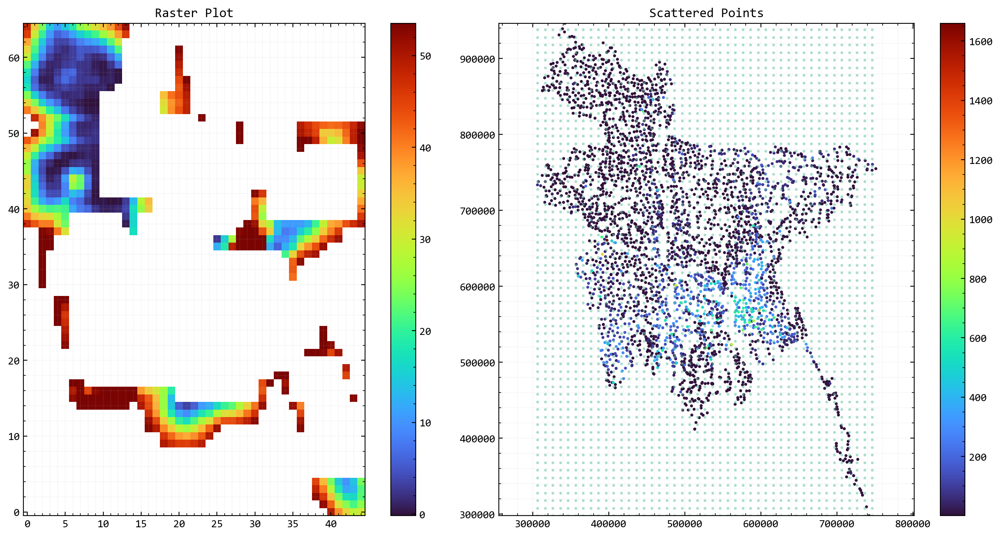

In [216]:
fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 90))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()


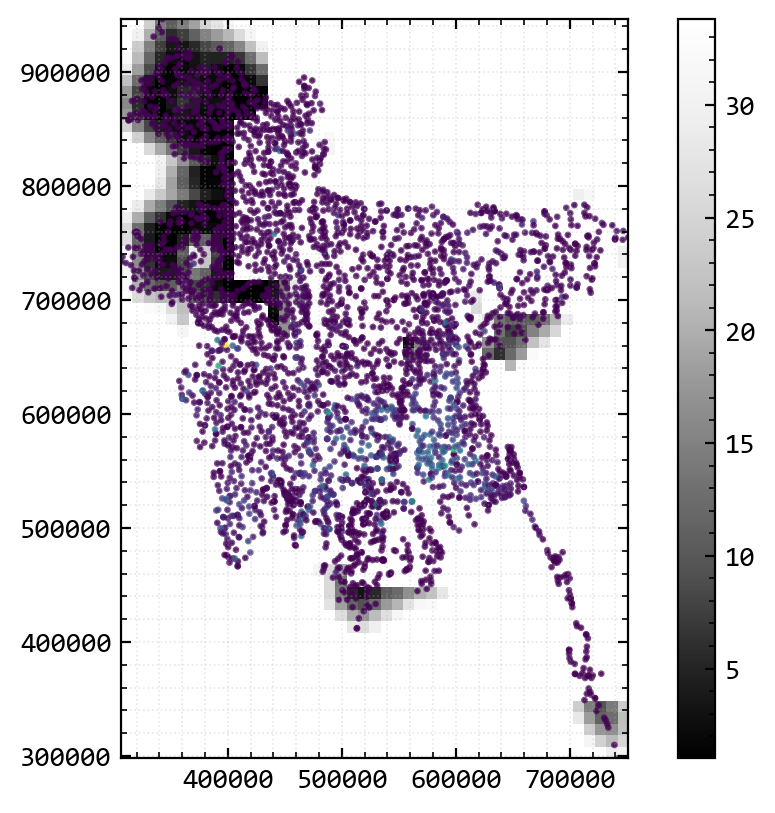

In [217]:
im = plt.imshow(Z_sk,origin="lower",cmap="Greys_r", vmin=np.nanpercentile(Z_sk, 6), vmax=np.nanpercentile(Z_sk,60), extent=[e_range[0], e_range[1], n_range[0], n_range[1]])
plt.scatter(x_o[:,0],x_o[:,1],c=z,s=2,alpha=0.7)
plt.colorbar(im)
plt.show()


4th attempt (Try: include constrain  $\lambda=1$ for solving $C * \lambda = c_o$)

In [ ]:

Z_sk = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    
    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    

    # Check if the matrix is singular
    if C.size == 0:
        print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        lam = np.linalg.solve(C, c_0)
    else:
        print(f"Matrix is singular at index {i}, skipping this point.")
        print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue

    #print(i,np.sum(lam))

    Z_sk[i] = (lam.T @ (z[neighborhood]-m) ) + m # interpolated value

#### __2. Indikator Kriging__

A.G. Journel, 1983, "Nonparametric estimation of spatial distributions", https://link.springer.com/article/10.1007/BF01031292